# Прв парцијален испит по Основи на Вештачката Интелигенција

Датум: 27.11.2021

## Задача 1

Разгледуваме фабрика за производство на пиво. За пакување на пивото во шишиња се користат рециклирани шишиња кои во фабриката пристигаат во гајби. Следат постапките:

1. Сите шишиња се ставаат врз платформата.
    - Платформата собира 15х15 шишиња.
    - За поедноставни пресметки за време на испитот, ќе сметаме дека платформата собира 7х7 шишиња.
2. Софтвер за препознавање ги скенира сите шишиња од платформата, и во себе забележува по еден код за секое шише:
    - (0) - Празно место, нема шише.
    - (1) - Скршено шише.
    - (2) - Шише во добра состојба, од нашата пивара.
    - (3) - Шише од друга пивара.
3. Роботот ги избира соодветните шишиња (со код 2) и ги префрла на подвижната лента за понатаму.
    - Роботот наеднаш може да земе 10 шишиња, бидејќи има 10 дланки (5 х 2).
    - За поедноставни пресметки за време на испитот, ќе сметаме дека роботот има 6 дланки (3 х 2), па роботот може наеднаш да земе најмногу 6 шишиња од платформата.
    - Роботот може да ротира за 90 степени.

Ваша задача е да напишете код со алгоритмите од вештачка интелигенција за чекорот 3. Целта е роботот во минимален број придвижувања да ги издвои соодветните шишиња (со код 2).

In [1]:
from IPython import display

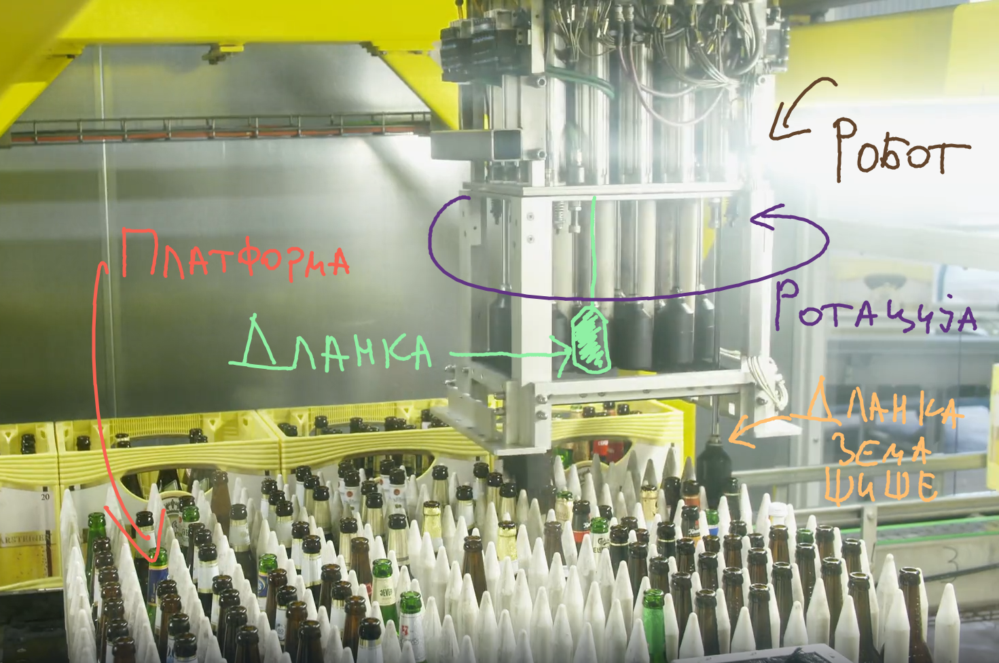

In [2]:
display.Image('images/labeled.png', width=600)

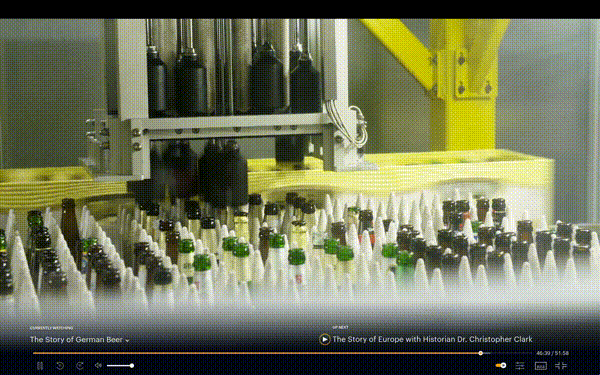

In [3]:
display.Image('images/plain.gif', width=600)

### Важно при решавањето
- Дефинираме состојбата да биде матрица 7х7 (торка од торки), како што е дефинирана променливата `g` подолу.
- За роботот сите придвижувања имаат еднаква тежина во пребарување.
    - Едно придвижување се дефинира како:
        - Чекор 1 - поместување
        - Чекор 2 - кревање шишиња
        - Чекор 3 - повторно поместување
        - Чекор 4 - ставање на шишињата во гајбата


**Нотација**
- ППШ = Пребарување Прво по Широчина
- ППД = Пребарување Прво по Длабочина

In [4]:
g  = (
    (0, 3, 2, 0, 2, 2, 2),
    (2, 1, 2, 2, 2, 3, 2),
    (2, 2, 0, 2, 2, 2, 2),
    (0, 2, 2, 2, 2, 2, 0),
    (2, 2, 3, 2, 2, 2, 2),
    (2, 2, 1, 2, 2, 2, 2),
    (0, 3, 0, 2, 2, 2, 2)
)

Подолу е даден еден пример за решение.

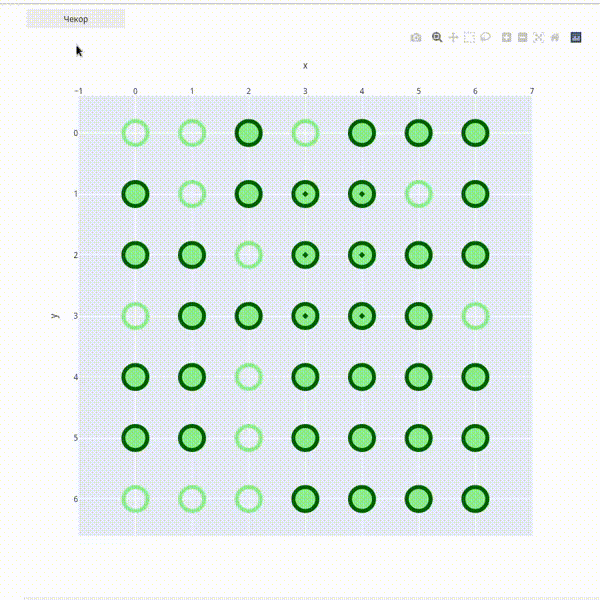

In [5]:
display.Image('images/solution.gif', width=600)

## Визуелизација

Овој код ќе ви помогне да го визуелизирате вашето решение. Решението треба да биде листа од торки и да биде сместено во променливата `SOLUTION`, како што е направено со променливата `example_solution` подолу. Податоците во `example_solution` се читаат од датотеката `example_solution.pickle` која служи само како пример.

In [6]:
import pickle
example_solution = pickle.load(open('example_solution.pickle', 'rb'))
SOLUTION = example_solution

In [7]:
from plotly import graph_objects as go
import ipywidgets as widgets

def create_fig():
    fig = go.FigureWidget()
    N = len(SOLUTION[0])
    x = [x for y in range(N) for x in range(N)]
    y = [y for y in range(N) for x in range(N)]
    symbols = ['circle' if bottle else 'circle-open' for row in SOLUTION[0] for bottle in row]
    fig.add_scatter(
        x=x, y=y,  mode='markers', marker_size=36, marker_line_width=6, 
        marker_line_color='darkgreen', marker_color='lightgreen', 
        marker_symbol=symbols)
    fig.update_xaxes(range=[-1, N], dtick=1, title='x', side='top')
    fig.update_yaxes(range=[-1, N], dtick=1, title='y', autorange='reversed')
    fig.update_layout(width=120*N, height=120*N, showlegend=False)
    return fig

def update_fig(old, new):
    N = len(SOLUTION[0])
    symbol = lambda y, x: f"circle{'-dot' if old[y][x] - new[y][x] else ''}" if old[y][x] else 'circle-open'
    symbols = [symbol(y, x) for y in range(N) for x in range(N)]
    fig.data[0].marker['symbol'] = symbols
    
def diff_generator():
    for table_old, table_new in zip(SOLUTION, SOLUTION[1:]):
        yield table_old, table_new
    yield SOLUTION[-1], SOLUTION[-1]
    yield 'end'

def clicked_button(button):    
    data = next(generator)
    if data != 'end':
        update_fig(*data)
    else:
        button.disabled = True
    
def create_button():
    button = widgets.Button(description='Чекор')
    button.on_click(clicked_button)
    return button

generator = diff_generator()
button = create_button()
fig = create_fig()
button.click()
widgets.VBox([button, fig])

    'data': [{'marker': {'colo…

### Прашања за графот од задача 1:
1. Објаснете како ќе се одвива разгранувањето на графот во овој проблем?

In [ ]:
5

2. Која е целната состојба?

In [ ]:
3

3. На кој начин ќе пристапите и зошто така?
    1. Ќе го разгранам целиот граф, па потоа ќе пребарувам.
    1. Ќе го разгранувам графот додека пребарувам.

In [ ]:
3

4. Дали очекувате проблеми, или пак подобрувања во пребарувањето, ако кодовите 1 и 3 од состојбата ги замените со 0? Зошто мислите така?

In [ ]:
5

### Прашања од слепо пребарување за задача 1:
Бидејќи сите тежини се исти во пребарувањето, логично е да користите ППШ или ППД.

1. Објаснете како ќе се одвива пребарувањето според ППД.

In [ ]:
5

2. Објаснете како ќе се одвива пребарувањето според ППШ.

In [ ]:
5

3. Што очекувате, кој алгоритам ќе работи побрзо за овој проблем? Објаснете зошто.

In [ ]:
5

4. Што очекувате, кој алгоритам ќе ја најде патеката со најмал број придвижувања на роботот?  Објаснете зошто.

In [ ]:
5

5. Што ако за ППШ треба многу време за пребарување? Колку долго време за пребарување е неприфатливо за вас како инженер во пиварата?

In [ ]:
5

6. Имајќи ги предвид теоретските недостатоци на ППД, дали во овој проблем ППД ќе заглави во бесконечна гранка, или пак сигурно ќе стигне до целта? Зошто мислите така?

In [ ]:
5

7. Напишете код за алгоритам кој слепо ќе пребарува. Изберете еден од ППШ или ППД, оној за кој сметате дека, во просек, побрзо ќе стигне до конечното решение за овој проблем.

### Прашања за пребарување А* за задача 1:

1. Предложете еврстика за овој проблем. Покажете дека истата е прифатлива.

In [ ]:
5

2. Општо, што очекувате да добиете со еврстиката во алгоритамот А*?

In [ ]:
5

3. Напишете код за А* алгоритам со смислената евристика.

4. Општо, како ќе покажете дека еден алгоритам А* работи побрзо користејќи одредена еврстика?

In [ ]:
5

5. Толкувајте што ќе се случи ако го зголемите влијанието на еврстиката во имплементираниот алгоритам од задача 1. Дали ова влијае на прифатливоста на евристиката? Објаснете зошто?

In [ ]:
5

**Совет**: Препорачливо е текстуалните одговори да не бидат подолги од 3 реченици. 

**Совет**: Пред да напишете одредена функција код, напишете највеќе 2 реченици кои ќе објаснат што прави функцијата. Тоа може да биде и docstring.